In [1]:
%pip install pandas mostlyai -qqqq

Note: you may need to restart the kernel to use updated packages.


Select your desired SDK mode:

1) Run in CLIENT mode 📡, connecting to a remote MOSTLY AI platform

2) Run in LOCAL mode 🏠, operating offline using your own compute

Enter your choice [1/2] (1):

Enter the Base URL 🌐 of the MOSTLY AI platform (https://app.mostly.ai):

Enter your API key 🔑 for https://app.mostly.ai (obtain ]8;id=93012;https://app.mostly.ai/settings/api-keys\here]8;;\) (mostly-xxx):

Note: To skip this prompt in the future, instantiate via MostlyAI(base_url=..., api_key=...).

Alternatively set MOSTLY_BASE_URL and MOSTLY_API_KEY as environment variables.

Initializing Synthetic Data SDK 4.5.2 in CLIENT mode 📡

Connected to ]8;id=269161;https://app.mostly.ai\https://app.mostly.ai]8;;\ 4.5.1 as kghamilton@protonmail.com

Created generator ]8;id=905266;https://app.mostly.ai/d/generators/64ba53f0-493b-4a47-beb7-e9f97f268ae0\64ba53f0-493b-4a47-beb7-e9f97f268ae0]8;;\

Started generator training

Output()

🎉 Your generator is ready! Use it to create synthetic data. Publish it so others can do the same.


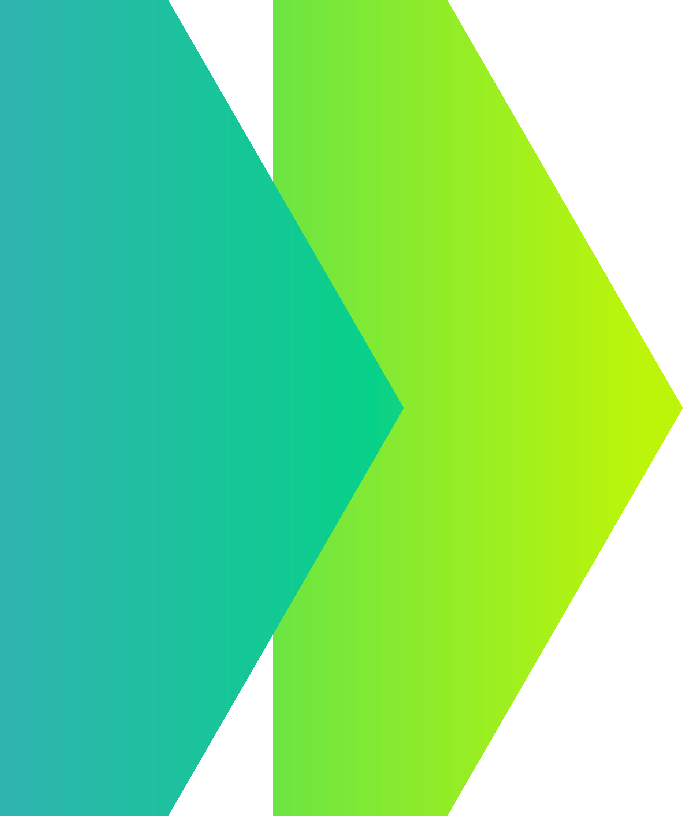
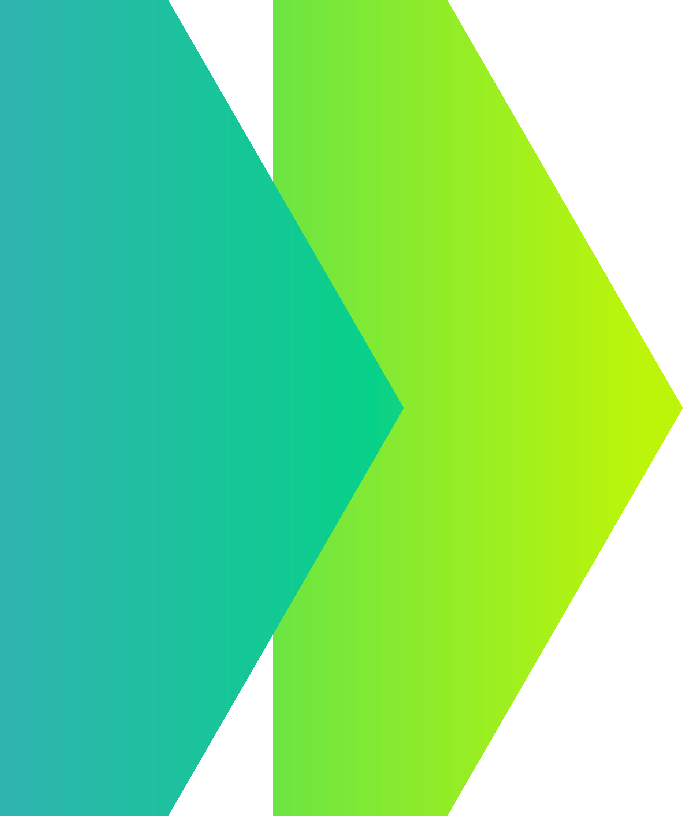
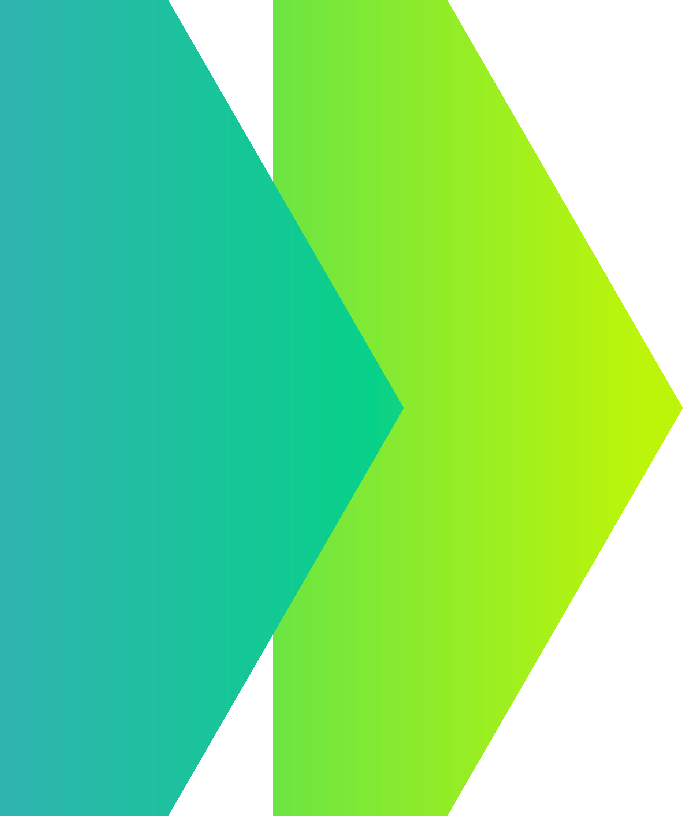
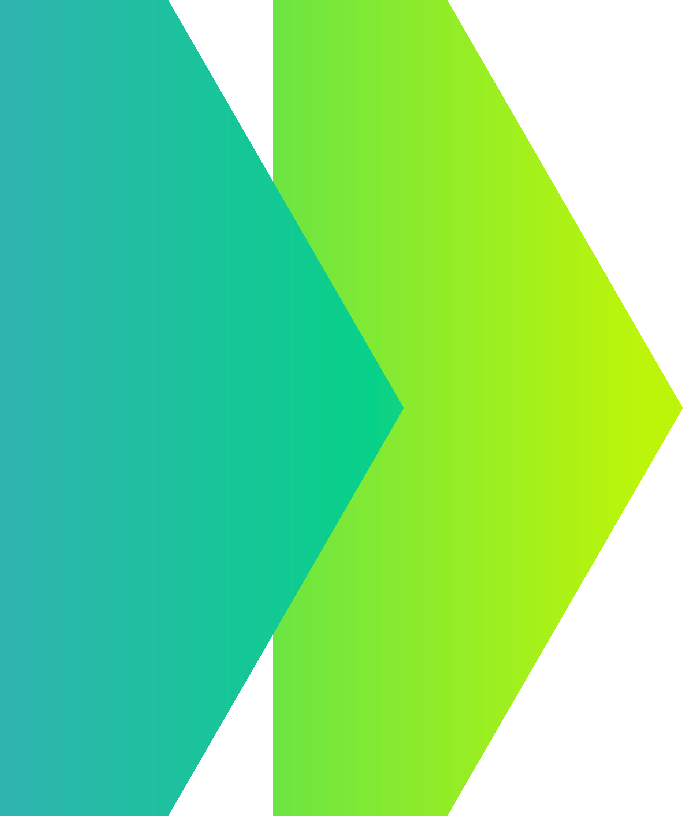
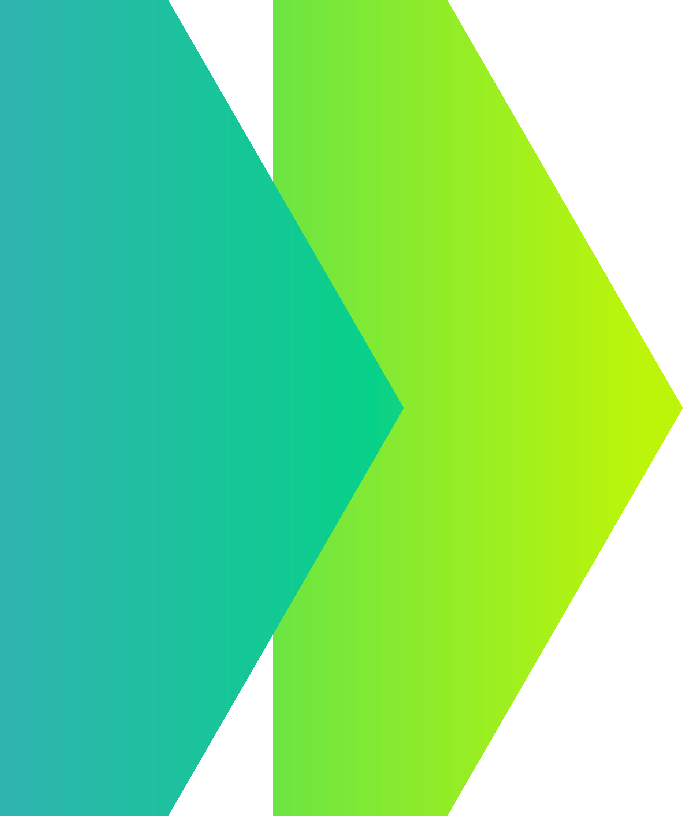
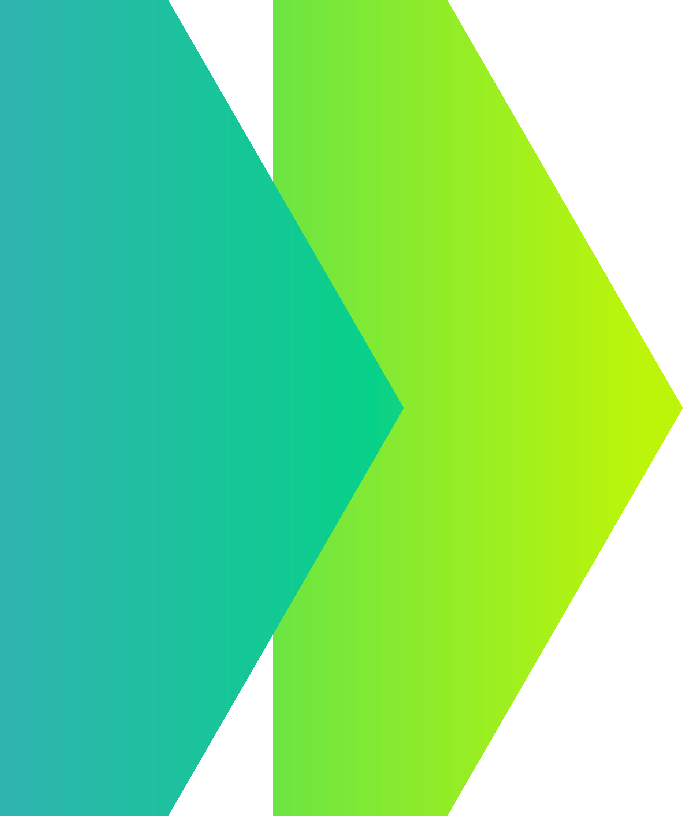

In [3]:
import pandas as pd
from mostlyai.sdk import MostlyAI

# load original time series data
repo_url = 'https://github.com/mostly-ai/public-demo-data/raw/refs/heads/dev/cdnow/'
df_original_purchases = pd.read_csv(f'{repo_url}/purchases.csv.gz')[['users_id', 'date', 'cds', 'amt']]

# ensure correct data type for DATE column
df_original_purchases['date'] = pd.to_datetime(df_original_purchases['date'])

# extract subject table from time-series data
df_original_users = df_original_purchases[['users_id']].drop_duplicates()

# instantiate SDK
mostly = MostlyAI()

# train a generator
g = mostly.train(config={
    'name': 'CDNOW',                      # name of the generator
    'tables': [{                          # provide list of table(s)
        'name': 'users',                  # name of the table
        'data': df_original_users,        # the original data as pd.DataFrame
        'primary_key': 'users_id',
    }, {
        'name': 'purchases',              # name of the table
        'data': df_original_purchases,    # the original data as pd.DataFrame
        'foreign_keys': [                 # foreign key configurations
            {'column': 'users_id', 'referenced_table': 'users', 'is_context': True},
        ],
        'tabular_model_configuration': {
            'max_training_time': 2,       # cap runtime for demo; set None for max accuracy
        },
    }],
})

# show Model QA reports
g.reports(display=True)

In [4]:
syn = mostly.probe(g, size=1000)
syn['purchases'].sort_values(['users_id', 'date'])

,users_id,date,cds,amt
674,mostly00-7e73-4639-b297-d9cf4310374d,1997-02-16T00:00:00.000,1,8.45
900,mostly00-aede-447f-b6fc-ef7ebb495d5b,1997-03-22T00:00:00.000,1,6.38
558,mostly00-b547-4a66-9b98-9284d9a4acfb,1997-02-08T00:00:00.000,1,11.85
1292,mostly00-b547-4a66-9b98-9284d9a4acfb,1997-03-04T00:00:00.000,2,36.99
299,mostly00-ddfd-42ec-b07b-e8795efe9ed2,1997-03-12T00:00:00.000,1,11.02
...,...,...,...,...
743,mostlyff-4d99-45fd-8058-5982c49eba0d,1997-01-27T00:00:00.000,4,57.96
38,mostlyff-5243-401c-9fed-8e8c54923021,1997-02-15T00:00:00.000,1,13.97
412,mostlyff-8af5-44e3-8bfe-ca5ad38b281e,1997-02-18T00:00:00.000,3,22.99
1214,mostlyff-8af5-44e3-8bfe-ca5ad38b281e,1997-03-31T00:00:00.000,3,35.07
